## In this analysis of the FashionMNIST dataset, we first preprocess the grayscale images, converting them into black-and-white format to standardize the data. Subsequently, we explore the dataset's characteristics, including its size, image dimensions, and pixel statistics, to gain foundational insights. Next, by examining pixel intensity distributions specific to each fashion class, we visualize the diversity within categories using histograms, while quantifying mean and standard deviation values. These statistical measures provide valuable understanding of pixel variations across different fashion items, essential for designing robust machine learning models. Ultimately, these insights inform model architecture decisions, facilitating optimized performance in black-and-white image classification tasks within the fashion domain.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
import torch
from torchvision import datasets, transforms

# Define data transformation
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Load the FashionMNIST dataset
dataset = datasets.FashionMNIST(root="./data", train=True, download=True, transform=transform)

# Calculate number of samples
num_samples = len(dataset)

# Get shape of the images
sample_img, _ = dataset[0]
img_shape = sample_img.shape

# Calculate mean and standard deviation of pixel values
pixel_mean = torch.mean(dataset.data.float() / 255.0)
pixel_stddev = torch.std(dataset.data.float() / 255.0)

# Print statistics
print("Number of samples:", num_samples)
print("Shape of images:", img_shape)
print("Mean of pixel values:", pixel_mean)
print("Standard deviation of pixel values:", pixel_stddev)


100%|██████████| 26421880/26421880 [00:02<00:00, 9146331.45it/s] 


Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 172437.89it/s]


Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:01<00:00, 3068839.62it/s]


Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 4995899.35it/s]


Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw

Number of samples: 60000
Shape of images: torch.Size([1, 28, 28])
Mean of pixel values: tensor(0.2860)
Standard deviation of pixel values: tensor(0.3530)


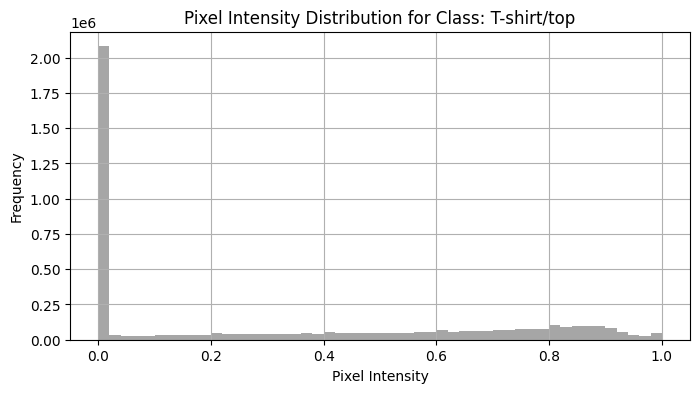

Class: T-shirt/top
Mean Pixel Intensity: 0.3256077766418457
Standard Deviation of Pixel Intensity: 0.35073918104171753
----------------------------------------


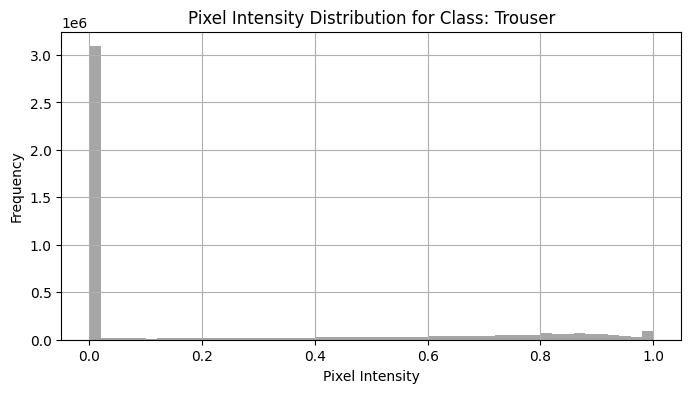

Class: Trouser
Mean Pixel Intensity: 0.22290532290935516
Standard Deviation of Pixel Intensity: 0.34353047609329224
----------------------------------------


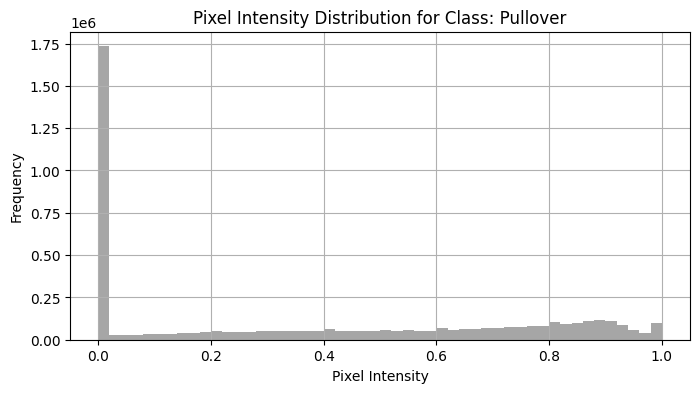

Class: Pullover
Mean Pixel Intensity: 0.3767010569572449
Standard Deviation of Pixel Intensity: 0.3586803078651428
----------------------------------------


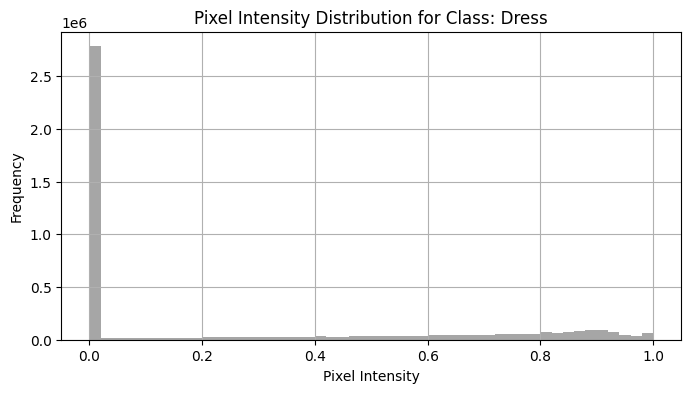

Class: Dress
Mean Pixel Intensity: 0.25889769196510315
Standard Deviation of Pixel Intensity: 0.3542196452617645
----------------------------------------


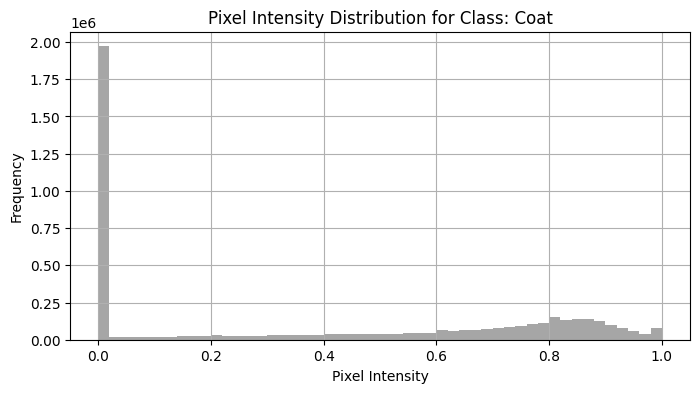

Class: Coat
Mean Pixel Intensity: 0.38532555103302
Standard Deviation of Pixel Intensity: 0.37631189823150635
----------------------------------------


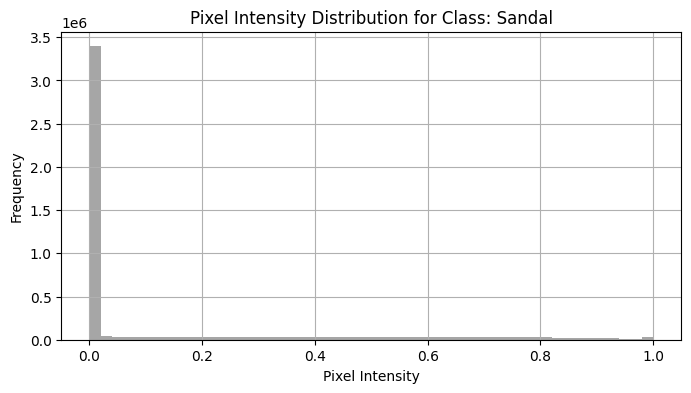

Class: Sandal
Mean Pixel Intensity: 0.1367354840040207
Standard Deviation of Pixel Intensity: 0.26310813426971436
----------------------------------------


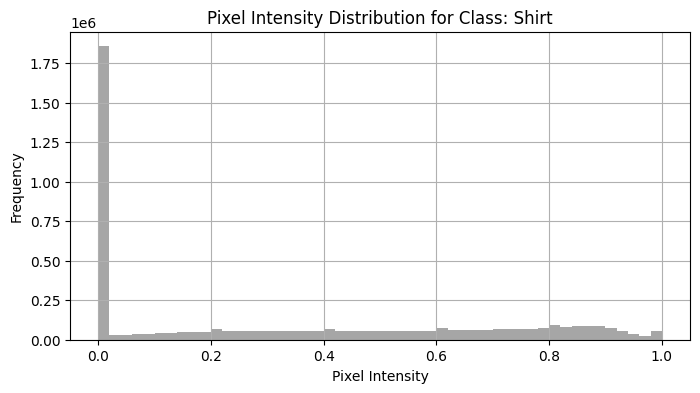

Class: Shirt
Mean Pixel Intensity: 0.33178478479385376
Standard Deviation of Pixel Intensity: 0.3392786681652069
----------------------------------------


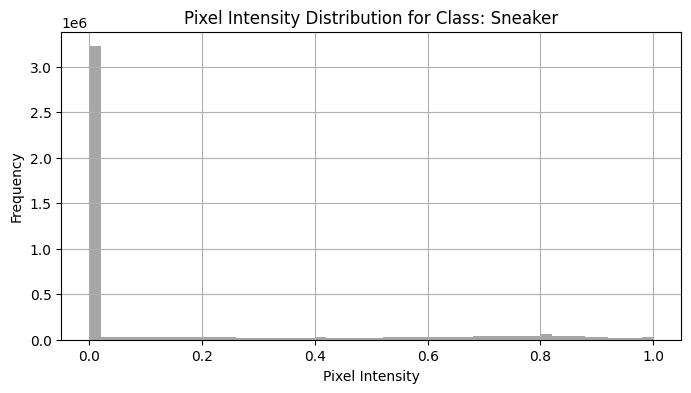

Class: Sneaker
Mean Pixel Intensity: 0.16769440472126007
Standard Deviation of Pixel Intensity: 0.29478660225868225
----------------------------------------


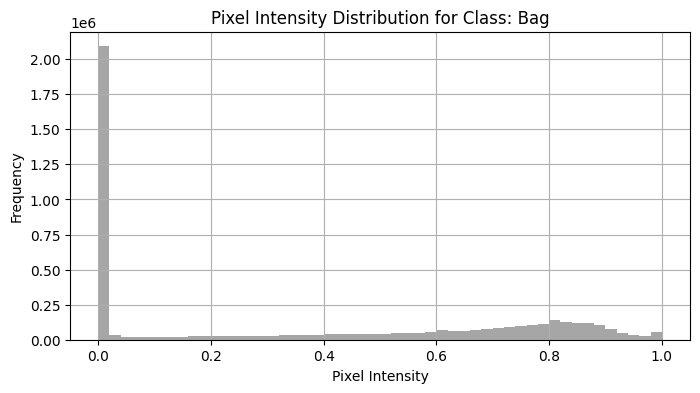

Class: Bag
Mean Pixel Intensity: 0.3535574674606323
Standard Deviation of Pixel Intensity: 0.3652712106704712
----------------------------------------


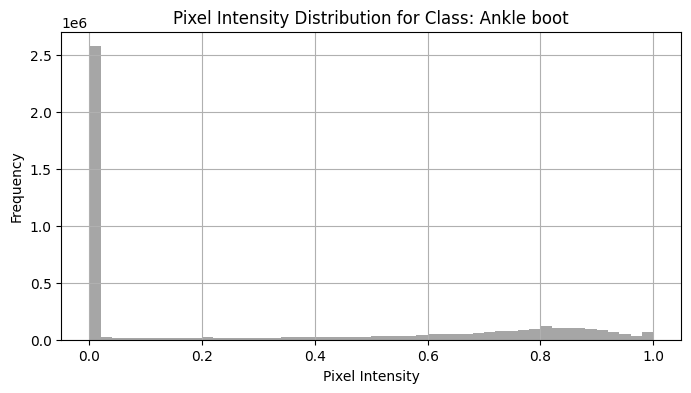

Class: Ankle boot
Mean Pixel Intensity: 0.3011965751647949
Standard Deviation of Pixel Intensity: 0.37053292989730835
----------------------------------------


In [ ]:
import torch
from torchvision import datasets, transforms
import matplotlib.pyplot as plt

# Load the FashionMNIST dataset
dataset = datasets.FashionMNIST(root="./data", train=True, download=True, transform=transforms.ToTensor())

# Define labels for the FashionMNIST dataset
labels = {
    0: 'T-shirt/top',
    1: 'Trouser',
    2: 'Pullover',
    3: 'Dress',
    4: 'Coat',
    5: 'Sandal',
    6: 'Shirt',
    7: 'Sneaker',
    8: 'Bag',
    9: 'Ankle boot'
}

# Iterate over each class
for class_label, class_name in labels.items():
    # Filter dataset for samples belonging to current class
    class_samples = [img for img, label in dataset if label == class_label]
    class_data = torch.stack(class_samples)

    # Calculate statistics
    mean_intensity = torch.mean(class_data.float())
    std_intensity = torch.std(class_data.float())

    # Plot pixel intensity distribution
    plt.figure(figsize=(8, 4))
    plt.hist(class_data.numpy().ravel(), bins=50, color='gray', alpha=0.7)
    plt.title(f'Pixel Intensity Distribution for Class: {class_name}')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

    # Print statistics
    print(f'Class: {class_name}')
    print(f'Mean Pixel Intensity: {mean_intensity.item()}')
    print(f'Standard Deviation of Pixel Intensity: {std_intensity.item()}')
    print('-' * 40)


1/1 [==============================] - 0s 100ms/step
0 [Discriminator loss: 0.839702, acc.: 51.56%] [Generator loss: 1.053458]
1/1 [==============================] - 0s 70ms/step


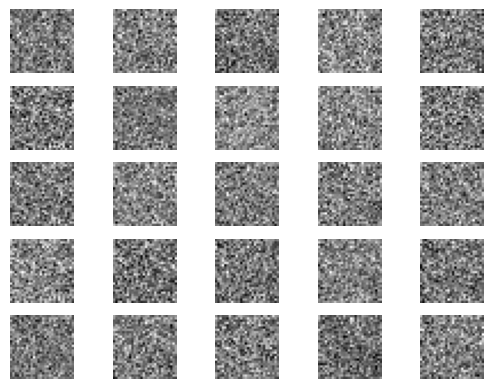

1/1 [==============================] - 0s 15ms/step
1 [Discriminator loss: 0.438552, acc.: 98.44%] [Generator loss: 1.005128]
1/1 [==============================] - 0s 15ms/step
2 [Discriminator loss: 0.382294, acc.: 90.62%] [Generator loss: 0.980597]
1/1 [==============================] - 0s 15ms/step
3 [Discriminator loss: 0.363004, acc.: 84.38%] [Generator loss: 0.928427]
1/1 [==============================] - 0s 15ms/step
4 [Discriminator loss: 0.349956, acc.: 85.94%] [Generator loss: 0.930152]
1/1 [==============================] - 0s 14ms/step
5 [Discriminator loss: 0.350618, acc.: 87.50%] [Generator loss: 0.938266]
1/1 [==============================] - 0s 14ms/step
6 [Discriminator loss: 0.345328, acc.: 81.25%] [Generator loss: 0.969003]
1/1 [==============================] - 0s 14ms/step
7 [Discriminator loss: 0.336446, acc.: 93.75%] [Generator loss: 1.008623]
1/1 [==============================] - 0s 15ms/step
8 [Discriminator loss: 0.325160, acc.: 93.75%] [Generator loss: 1.

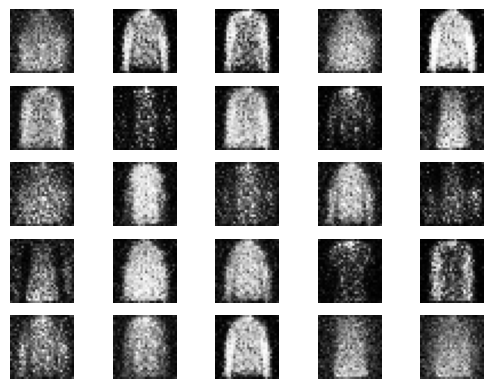

1/1 [==============================] - 0s 15ms/step
1001 [Discriminator loss: 0.397856, acc.: 87.50%] [Generator loss: 2.221259]
1/1 [==============================] - 0s 15ms/step
1002 [Discriminator loss: 0.347641, acc.: 84.38%] [Generator loss: 2.629516]
1/1 [==============================] - 0s 21ms/step
1003 [Discriminator loss: 0.228215, acc.: 92.19%] [Generator loss: 2.818310]
1/1 [==============================] - 0s 14ms/step
1004 [Discriminator loss: 0.245111, acc.: 90.62%] [Generator loss: 3.396191]
1/1 [==============================] - 0s 15ms/step
1005 [Discriminator loss: 0.419450, acc.: 78.12%] [Generator loss: 2.977122]
1/1 [==============================] - 0s 15ms/step
1006 [Discriminator loss: 0.406244, acc.: 85.94%] [Generator loss: 2.441106]
1/1 [==============================] - 0s 15ms/step
1007 [Discriminator loss: 0.247722, acc.: 90.62%] [Generator loss: 2.981665]
1/1 [==============================] - 0s 15ms/step
1008 [Discriminator loss: 0.260081, acc.: 87.

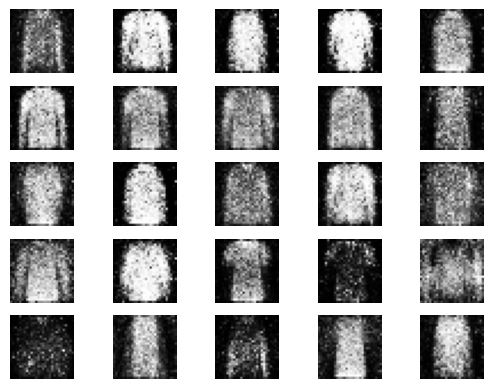

1/1 [==============================] - 0s 19ms/step
2001 [Discriminator loss: 0.354404, acc.: 87.50%] [Generator loss: 2.516661]
1/1 [==============================] - 0s 19ms/step
2002 [Discriminator loss: 0.231054, acc.: 87.50%] [Generator loss: 2.872213]
1/1 [==============================] - 0s 29ms/step
2003 [Discriminator loss: 0.440292, acc.: 82.81%] [Generator loss: 2.393642]
1/1 [==============================] - 0s 23ms/step
2004 [Discriminator loss: 0.276616, acc.: 87.50%] [Generator loss: 2.779044]
1/1 [==============================] - 0s 24ms/step
2005 [Discriminator loss: 0.291795, acc.: 90.62%] [Generator loss: 2.506559]
1/1 [==============================] - 0s 24ms/step
2006 [Discriminator loss: 0.608154, acc.: 62.50%] [Generator loss: 2.597557]
1/1 [==============================] - 0s 25ms/step
2007 [Discriminator loss: 0.321991, acc.: 89.06%] [Generator loss: 2.418209]
1/1 [==============================] - 0s 31ms/step
2008 [Discriminator loss: 0.538282, acc.: 71.

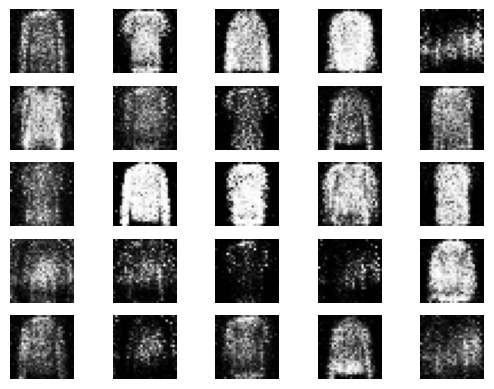

1/1 [==============================] - 0s 18ms/step
3001 [Discriminator loss: 0.373170, acc.: 79.69%] [Generator loss: 2.948112]
1/1 [==============================] - 0s 18ms/step
3002 [Discriminator loss: 0.488983, acc.: 76.56%] [Generator loss: 2.281410]
1/1 [==============================] - 0s 25ms/step
3003 [Discriminator loss: 0.486727, acc.: 73.44%] [Generator loss: 1.732613]
1/1 [==============================] - 0s 28ms/step
3004 [Discriminator loss: 0.298121, acc.: 84.38%] [Generator loss: 2.175095]
1/1 [==============================] - 0s 28ms/step
3005 [Discriminator loss: 0.486466, acc.: 78.12%] [Generator loss: 2.760158]
1/1 [==============================] - 0s 19ms/step
3006 [Discriminator loss: 0.470589, acc.: 82.81%] [Generator loss: 1.991382]
1/1 [==============================] - 0s 25ms/step
3007 [Discriminator loss: 0.428826, acc.: 81.25%] [Generator loss: 2.242820]
1/1 [==============================] - 0s 22ms/step
3008 [Discriminator loss: 0.443447, acc.: 84.

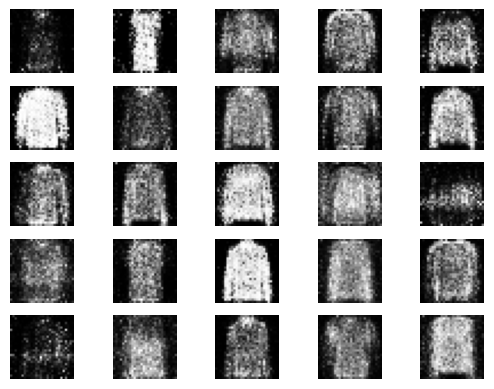

1/1 [==============================] - 0s 17ms/step
4001 [Discriminator loss: 0.356404, acc.: 79.69%] [Generator loss: 2.503118]
1/1 [==============================] - 0s 16ms/step
4002 [Discriminator loss: 0.497809, acc.: 70.31%] [Generator loss: 1.985657]
1/1 [==============================] - 0s 25ms/step
4003 [Discriminator loss: 0.353296, acc.: 81.25%] [Generator loss: 2.676766]
1/1 [==============================] - 0s 17ms/step
4004 [Discriminator loss: 0.292061, acc.: 87.50%] [Generator loss: 2.903471]
1/1 [==============================] - 0s 16ms/step
4005 [Discriminator loss: 0.617516, acc.: 70.31%] [Generator loss: 1.913727]
1/1 [==============================] - 0s 16ms/step
4006 [Discriminator loss: 0.428006, acc.: 82.81%] [Generator loss: 1.962894]
1/1 [==============================] - 0s 15ms/step
4007 [Discriminator loss: 0.269695, acc.: 92.19%] [Generator loss: 2.296182]
1/1 [==============================] - 0s 16ms/step
4008 [Discriminator loss: 0.426297, acc.: 81.

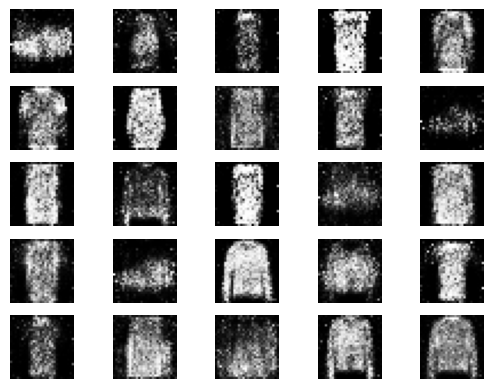

1/1 [==============================] - 0s 18ms/step
5001 [Discriminator loss: 0.402529, acc.: 81.25%] [Generator loss: 2.011766]
1/1 [==============================] - 0s 16ms/step
5002 [Discriminator loss: 0.390768, acc.: 85.94%] [Generator loss: 1.853129]
1/1 [==============================] - 0s 24ms/step
5003 [Discriminator loss: 0.622918, acc.: 75.00%] [Generator loss: 1.935785]
1/1 [==============================] - 0s 23ms/step
5004 [Discriminator loss: 0.470961, acc.: 82.81%] [Generator loss: 1.950493]
1/1 [==============================] - 0s 23ms/step
5005 [Discriminator loss: 0.486040, acc.: 79.69%] [Generator loss: 1.964419]
1/1 [==============================] - 0s 18ms/step
5006 [Discriminator loss: 0.367483, acc.: 82.81%] [Generator loss: 1.727467]
1/1 [==============================] - 0s 26ms/step
5007 [Discriminator loss: 0.394784, acc.: 81.25%] [Generator loss: 1.653316]
1/1 [==============================] - 0s 24ms/step
5008 [Discriminator loss: 0.434628, acc.: 79.

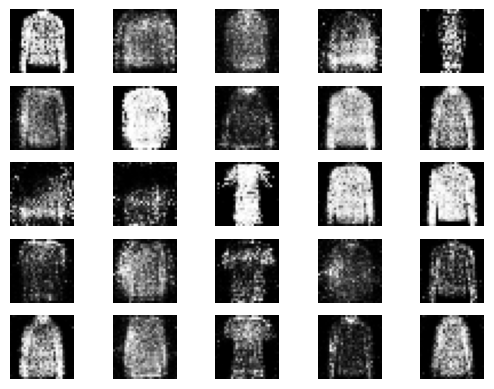

1/1 [==============================] - 0s 24ms/step
6001 [Discriminator loss: 0.362071, acc.: 82.81%] [Generator loss: 1.788056]
1/1 [==============================] - 0s 22ms/step
6002 [Discriminator loss: 0.457149, acc.: 78.12%] [Generator loss: 2.341998]
1/1 [==============================] - 0s 22ms/step
6003 [Discriminator loss: 0.555566, acc.: 75.00%] [Generator loss: 1.922502]
1/1 [==============================] - 0s 25ms/step
6004 [Discriminator loss: 0.323236, acc.: 87.50%] [Generator loss: 1.879918]
1/1 [==============================] - 0s 24ms/step
6005 [Discriminator loss: 0.356631, acc.: 81.25%] [Generator loss: 1.891258]
1/1 [==============================] - 0s 21ms/step
6006 [Discriminator loss: 0.650711, acc.: 70.31%] [Generator loss: 1.445029]
1/1 [==============================] - 0s 25ms/step
6007 [Discriminator loss: 0.617460, acc.: 64.06%] [Generator loss: 1.460040]
1/1 [==============================] - 0s 24ms/step
6008 [Discriminator loss: 0.407725, acc.: 79.

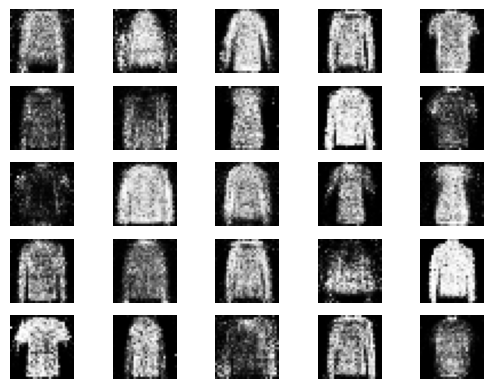

1/1 [==============================] - 0s 32ms/step
7001 [Discriminator loss: 0.376866, acc.: 84.38%] [Generator loss: 1.776234]
1/1 [==============================] - 0s 35ms/step
7002 [Discriminator loss: 0.482758, acc.: 79.69%] [Generator loss: 1.779670]
1/1 [==============================] - 0s 23ms/step
7003 [Discriminator loss: 0.445259, acc.: 81.25%] [Generator loss: 1.894913]
1/1 [==============================] - 0s 20ms/step
7004 [Discriminator loss: 0.426160, acc.: 79.69%] [Generator loss: 1.664867]
1/1 [==============================] - 0s 28ms/step
7005 [Discriminator loss: 0.522844, acc.: 70.31%] [Generator loss: 1.552622]
1/1 [==============================] - 0s 21ms/step
7006 [Discriminator loss: 0.472844, acc.: 75.00%] [Generator loss: 1.499422]
1/1 [==============================] - 0s 20ms/step
7007 [Discriminator loss: 0.443019, acc.: 78.12%] [Generator loss: 1.676541]
1/1 [==============================] - 0s 26ms/step
7008 [Discriminator loss: 0.491649, acc.: 76.

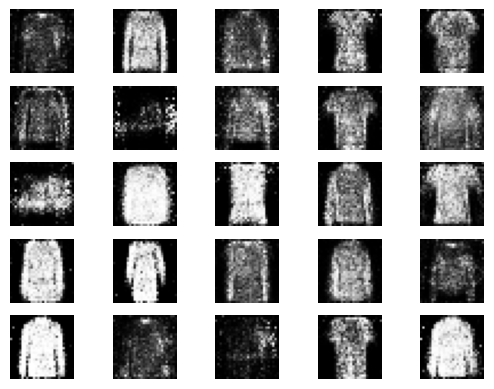

1/1 [==============================] - 0s 27ms/step
8001 [Discriminator loss: 0.390866, acc.: 82.81%] [Generator loss: 2.005764]
1/1 [==============================] - 0s 25ms/step
8002 [Discriminator loss: 0.442628, acc.: 85.94%] [Generator loss: 1.757900]
1/1 [==============================] - 0s 25ms/step
8003 [Discriminator loss: 0.507074, acc.: 68.75%] [Generator loss: 1.701170]
1/1 [==============================] - 0s 42ms/step
8004 [Discriminator loss: 0.416325, acc.: 76.56%] [Generator loss: 1.543189]
1/1 [==============================] - 0s 33ms/step
8005 [Discriminator loss: 0.405588, acc.: 84.38%] [Generator loss: 1.763729]
1/1 [==============================] - 0s 48ms/step
8006 [Discriminator loss: 0.373604, acc.: 81.25%] [Generator loss: 1.631653]
1/1 [==============================] - 0s 28ms/step
8007 [Discriminator loss: 0.472745, acc.: 73.44%] [Generator loss: 1.889294]
1/1 [==============================] - 0s 26ms/step
8008 [Discriminator loss: 0.522267, acc.: 73.

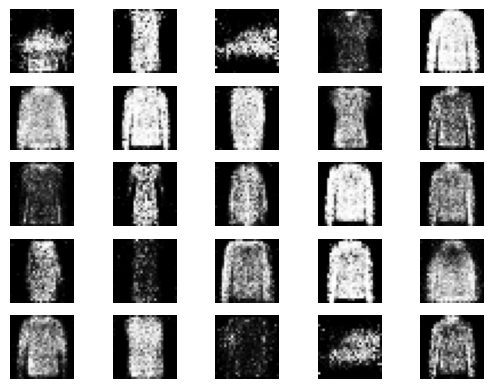

1/1 [==============================] - 0s 24ms/step
9001 [Discriminator loss: 0.319456, acc.: 85.94%] [Generator loss: 1.716466]
1/1 [==============================] - 0s 39ms/step
9002 [Discriminator loss: 0.502645, acc.: 76.56%] [Generator loss: 1.590508]
1/1 [==============================] - 0s 25ms/step
9003 [Discriminator loss: 0.425558, acc.: 81.25%] [Generator loss: 1.741297]
1/1 [==============================] - 0s 25ms/step
9004 [Discriminator loss: 0.366828, acc.: 79.69%] [Generator loss: 1.814744]
1/1 [==============================] - 0s 23ms/step
9005 [Discriminator loss: 0.424920, acc.: 81.25%] [Generator loss: 1.600540]
1/1 [==============================] - 0s 29ms/step
9006 [Discriminator loss: 0.295535, acc.: 87.50%] [Generator loss: 1.820193]
1/1 [==============================] - 0s 22ms/step
9007 [Discriminator loss: 0.449114, acc.: 76.56%] [Generator loss: 1.764367]
1/1 [==============================] - 0s 23ms/step
9008 [Discriminator loss: 0.572616, acc.: 70.

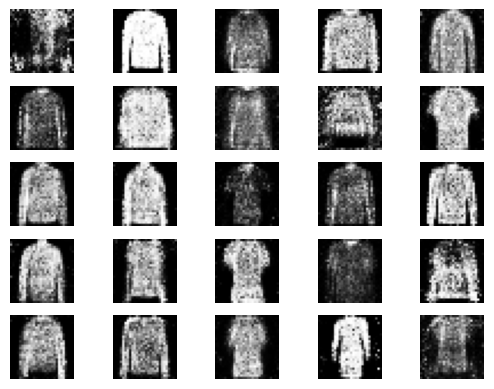

1/1 [==============================] - 0s 27ms/step
10001 [Discriminator loss: 0.468466, acc.: 78.12%] [Generator loss: 1.836598]
1/1 [==============================] - 0s 28ms/step
10002 [Discriminator loss: 0.508796, acc.: 68.75%] [Generator loss: 2.012941]
1/1 [==============================] - 0s 28ms/step
10003 [Discriminator loss: 0.696038, acc.: 62.50%] [Generator loss: 1.749070]
1/1 [==============================] - 0s 27ms/step
10004 [Discriminator loss: 0.430731, acc.: 81.25%] [Generator loss: 1.661591]
1/1 [==============================] - 0s 29ms/step
10005 [Discriminator loss: 0.597380, acc.: 60.94%] [Generator loss: 1.694068]
1/1 [==============================] - 0s 30ms/step
10006 [Discriminator loss: 0.387250, acc.: 82.81%] [Generator loss: 1.674136]
1/1 [==============================] - 0s 29ms/step
10007 [Discriminator loss: 0.462214, acc.: 82.81%] [Generator loss: 1.516925]
1/1 [==============================] - 0s 28ms/step
10008 [Discriminator loss: 0.396549, a

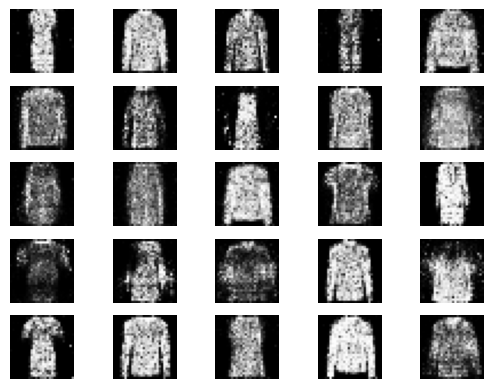

1/1 [==============================] - 0s 28ms/step
11001 [Discriminator loss: 0.367652, acc.: 85.94%] [Generator loss: 1.828613]
1/1 [==============================] - 0s 30ms/step
11002 [Discriminator loss: 0.421590, acc.: 81.25%] [Generator loss: 1.667340]
1/1 [==============================] - 0s 31ms/step
11003 [Discriminator loss: 0.529798, acc.: 71.88%] [Generator loss: 1.768934]
1/1 [==============================] - 0s 28ms/step
11004 [Discriminator loss: 0.390640, acc.: 82.81%] [Generator loss: 1.741344]
1/1 [==============================] - 0s 34ms/step
11005 [Discriminator loss: 0.478452, acc.: 78.12%] [Generator loss: 1.731934]
1/1 [==============================] - 0s 28ms/step
11006 [Discriminator loss: 0.424360, acc.: 78.12%] [Generator loss: 1.611710]
1/1 [==============================] - 0s 27ms/step
11007 [Discriminator loss: 0.443326, acc.: 76.56%] [Generator loss: 2.006114]
1/1 [==============================] - 0s 29ms/step
11008 [Discriminator loss: 0.498194, a

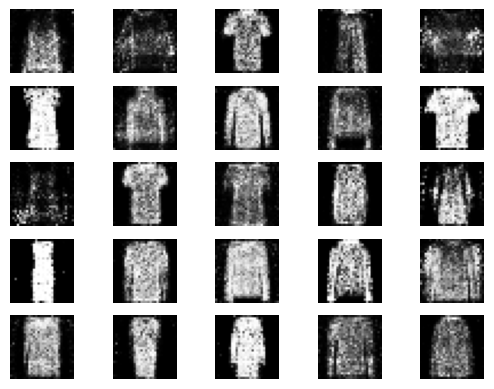

1/1 [==============================] - 0s 27ms/step
12001 [Discriminator loss: 0.547827, acc.: 68.75%] [Generator loss: 1.568202]
1/1 [==============================] - 0s 26ms/step
12002 [Discriminator loss: 0.459928, acc.: 78.12%] [Generator loss: 1.454477]
1/1 [==============================] - 0s 29ms/step
12003 [Discriminator loss: 0.533859, acc.: 76.56%] [Generator loss: 1.582289]
1/1 [==============================] - 0s 29ms/step
12004 [Discriminator loss: 0.438895, acc.: 73.44%] [Generator loss: 1.527070]
1/1 [==============================] - 0s 32ms/step
12005 [Discriminator loss: 0.453769, acc.: 78.12%] [Generator loss: 1.707470]
1/1 [==============================] - 0s 33ms/step
12006 [Discriminator loss: 0.459825, acc.: 81.25%] [Generator loss: 1.559386]
1/1 [==============================] - 0s 35ms/step
12007 [Discriminator loss: 0.372355, acc.: 81.25%] [Generator loss: 1.646242]
1/1 [==============================] - 0s 28ms/step
12008 [Discriminator loss: 0.401867, a

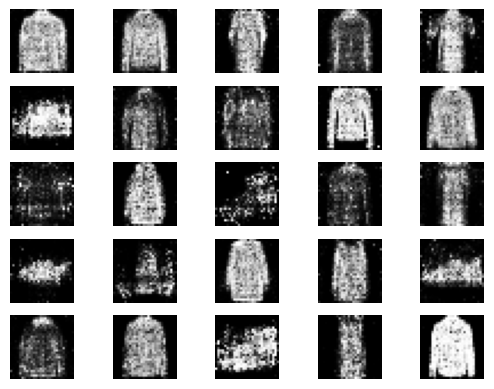

1/1 [==============================] - 0s 26ms/step
13001 [Discriminator loss: 0.426646, acc.: 76.56%] [Generator loss: 1.571880]
1/1 [==============================] - 0s 24ms/step
13002 [Discriminator loss: 0.428028, acc.: 78.12%] [Generator loss: 1.797770]
1/1 [==============================] - 0s 27ms/step
13003 [Discriminator loss: 0.512964, acc.: 76.56%] [Generator loss: 1.655926]
1/1 [==============================] - 0s 22ms/step
13004 [Discriminator loss: 0.435425, acc.: 78.12%] [Generator loss: 1.540060]
1/1 [==============================] - 0s 27ms/step
13005 [Discriminator loss: 0.549305, acc.: 68.75%] [Generator loss: 1.794138]
1/1 [==============================] - 0s 26ms/step
13006 [Discriminator loss: 0.400217, acc.: 76.56%] [Generator loss: 1.807821]
1/1 [==============================] - 0s 24ms/step
13007 [Discriminator loss: 0.524139, acc.: 73.44%] [Generator loss: 1.648449]
1/1 [==============================] - 0s 26ms/step
13008 [Discriminator loss: 0.449371, a

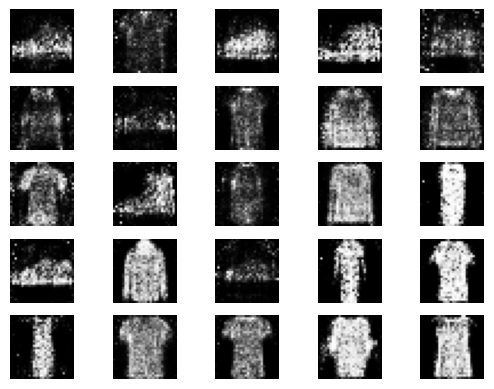

1/1 [==============================] - 0s 29ms/step
14001 [Discriminator loss: 0.554446, acc.: 71.88%] [Generator loss: 1.605382]
1/1 [==============================] - 0s 29ms/step
14002 [Discriminator loss: 0.523182, acc.: 68.75%] [Generator loss: 1.439769]
1/1 [==============================] - 0s 30ms/step
14003 [Discriminator loss: 0.388212, acc.: 84.38%] [Generator loss: 2.009758]
1/1 [==============================] - 0s 32ms/step
14004 [Discriminator loss: 0.401488, acc.: 81.25%] [Generator loss: 1.665716]
1/1 [==============================] - 0s 30ms/step
14005 [Discriminator loss: 0.490996, acc.: 81.25%] [Generator loss: 1.612211]
1/1 [==============================] - 0s 30ms/step
14006 [Discriminator loss: 0.529686, acc.: 68.75%] [Generator loss: 1.740942]
1/1 [==============================] - 0s 50ms/step
14007 [Discriminator loss: 0.582784, acc.: 71.88%] [Generator loss: 1.604903]
1/1 [==============================] - 0s 40ms/step
14008 [Discriminator loss: 0.537177, a

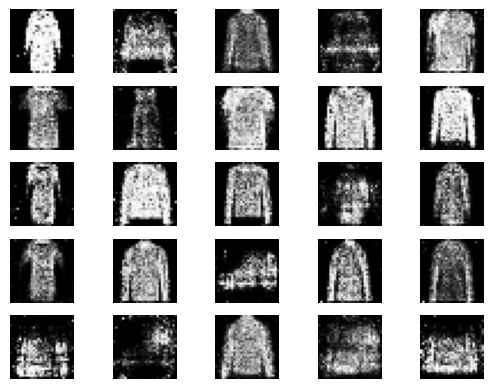

1/1 [==============================] - 0s 35ms/step
15001 [Discriminator loss: 0.509670, acc.: 76.56%] [Generator loss: 1.757440]
1/1 [==============================] - 0s 31ms/step
15002 [Discriminator loss: 0.400319, acc.: 79.69%] [Generator loss: 1.441497]
1/1 [==============================] - 0s 32ms/step
15003 [Discriminator loss: 0.375494, acc.: 85.94%] [Generator loss: 1.886892]
1/1 [==============================] - 0s 34ms/step
15004 [Discriminator loss: 0.467955, acc.: 79.69%] [Generator loss: 1.721413]
1/1 [==============================] - 0s 36ms/step
15005 [Discriminator loss: 0.388711, acc.: 84.38%] [Generator loss: 1.634883]
1/1 [==============================] - 0s 33ms/step
15006 [Discriminator loss: 0.541589, acc.: 67.19%] [Generator loss: 1.679409]
1/1 [==============================] - 0s 35ms/step
15007 [Discriminator loss: 0.526381, acc.: 70.31%] [Generator loss: 1.772943]
1/1 [==============================] - 0s 32ms/step
15008 [Discriminator loss: 0.432217, a

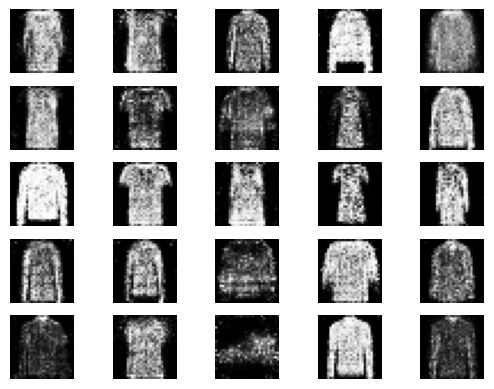

1/1 [==============================] - 0s 42ms/step
16001 [Discriminator loss: 0.637176, acc.: 68.75%] [Generator loss: 1.709429]
1/1 [==============================] - 0s 35ms/step
16002 [Discriminator loss: 0.493625, acc.: 71.88%] [Generator loss: 1.759884]
1/1 [==============================] - 0s 59ms/step
16003 [Discriminator loss: 0.450350, acc.: 81.25%] [Generator loss: 1.776456]
1/1 [==============================] - 0s 37ms/step
16004 [Discriminator loss: 0.481218, acc.: 78.12%] [Generator loss: 1.332230]
1/1 [==============================] - 0s 32ms/step
16005 [Discriminator loss: 0.423529, acc.: 82.81%] [Generator loss: 1.794446]
1/1 [==============================] - 0s 38ms/step
16006 [Discriminator loss: 0.501887, acc.: 73.44%] [Generator loss: 1.617622]
1/1 [==============================] - 0s 51ms/step
16007 [Discriminator loss: 0.543839, acc.: 71.88%] [Generator loss: 1.482776]
1/1 [==============================] - 0s 63ms/step
16008 [Discriminator loss: 0.518473, a

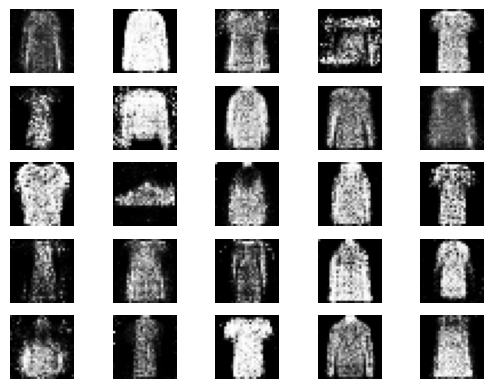

1/1 [==============================] - 0s 24ms/step
17001 [Discriminator loss: 0.538733, acc.: 71.88%] [Generator loss: 1.796530]
1/1 [==============================] - 0s 23ms/step
17002 [Discriminator loss: 0.387414, acc.: 85.94%] [Generator loss: 1.679599]
1/1 [==============================] - 0s 30ms/step
17003 [Discriminator loss: 0.733292, acc.: 60.94%] [Generator loss: 1.616259]
1/1 [==============================] - 0s 24ms/step
17004 [Discriminator loss: 0.536088, acc.: 78.12%] [Generator loss: 1.595048]
1/1 [==============================] - 0s 24ms/step
17005 [Discriminator loss: 0.459854, acc.: 82.81%] [Generator loss: 1.765839]
1/1 [==============================] - 0s 24ms/step
17006 [Discriminator loss: 0.497535, acc.: 76.56%] [Generator loss: 1.561820]
1/1 [==============================] - 0s 23ms/step
17007 [Discriminator loss: 0.454222, acc.: 76.56%] [Generator loss: 1.842025]
1/1 [==============================] - 0s 24ms/step
17008 [Discriminator loss: 0.477044, a

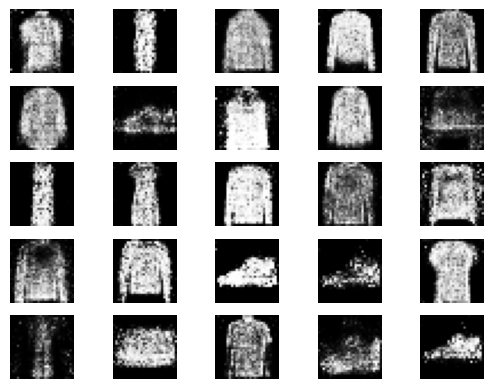

1/1 [==============================] - 0s 39ms/step
18001 [Discriminator loss: 0.481715, acc.: 70.31%] [Generator loss: 1.645762]
1/1 [==============================] - 0s 33ms/step
18002 [Discriminator loss: 0.551712, acc.: 67.19%] [Generator loss: 1.807777]
1/1 [==============================] - 0s 37ms/step
18003 [Discriminator loss: 0.419751, acc.: 81.25%] [Generator loss: 1.551957]
1/1 [==============================] - 0s 34ms/step
18004 [Discriminator loss: 0.542322, acc.: 73.44%] [Generator loss: 1.439813]
1/1 [==============================] - 0s 31ms/step
18005 [Discriminator loss: 0.522366, acc.: 75.00%] [Generator loss: 1.565575]
1/1 [==============================] - 0s 34ms/step
18006 [Discriminator loss: 0.500336, acc.: 71.88%] [Generator loss: 1.441497]
1/1 [==============================] - 0s 29ms/step
18007 [Discriminator loss: 0.392318, acc.: 78.12%] [Generator loss: 1.967714]
1/1 [==============================] - 0s 64ms/step
18008 [Discriminator loss: 0.473870, a

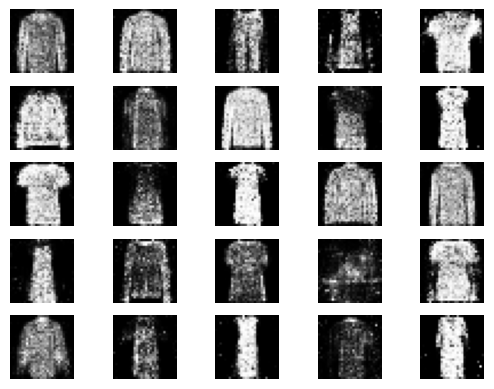

1/1 [==============================] - 0s 28ms/step
19001 [Discriminator loss: 0.329327, acc.: 85.94%] [Generator loss: 1.556156]
1/1 [==============================] - 0s 28ms/step
19002 [Discriminator loss: 0.379864, acc.: 84.38%] [Generator loss: 1.430164]
1/1 [==============================] - 0s 26ms/step
19003 [Discriminator loss: 0.333323, acc.: 84.38%] [Generator loss: 1.591745]
1/1 [==============================] - 0s 27ms/step
19004 [Discriminator loss: 0.356497, acc.: 82.81%] [Generator loss: 1.949062]
1/1 [==============================] - 0s 26ms/step
19005 [Discriminator loss: 0.462383, acc.: 78.12%] [Generator loss: 1.954279]
1/1 [==============================] - 0s 28ms/step
19006 [Discriminator loss: 0.428569, acc.: 82.81%] [Generator loss: 1.544050]
1/1 [==============================] - 0s 32ms/step
19007 [Discriminator loss: 0.485647, acc.: 75.00%] [Generator loss: 1.487958]
1/1 [==============================] - 0s 33ms/step
19008 [Discriminator loss: 0.459856, a

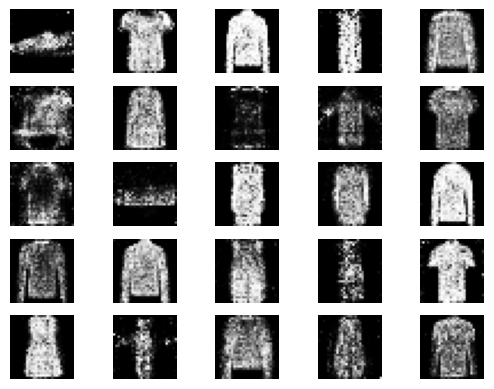

1/1 [==============================] - 0s 30ms/step
20001 [Discriminator loss: 0.527201, acc.: 78.12%] [Generator loss: 1.410110]
1/1 [==============================] - 0s 30ms/step
20002 [Discriminator loss: 0.457586, acc.: 78.12%] [Generator loss: 1.446859]
1/1 [==============================] - 0s 28ms/step
20003 [Discriminator loss: 0.503450, acc.: 82.81%] [Generator loss: 1.823665]
1/1 [==============================] - 0s 26ms/step
20004 [Discriminator loss: 0.456023, acc.: 79.69%] [Generator loss: 1.572068]
1/1 [==============================] - 0s 26ms/step
20005 [Discriminator loss: 0.364285, acc.: 87.50%] [Generator loss: 1.860974]
1/1 [==============================] - 0s 26ms/step
20006 [Discriminator loss: 0.530536, acc.: 70.31%] [Generator loss: 1.602691]
1/1 [==============================] - 0s 29ms/step
20007 [Discriminator loss: 0.411352, acc.: 81.25%] [Generator loss: 1.414024]
1/1 [==============================] - 0s 25ms/step
20008 [Discriminator loss: 0.400886, a

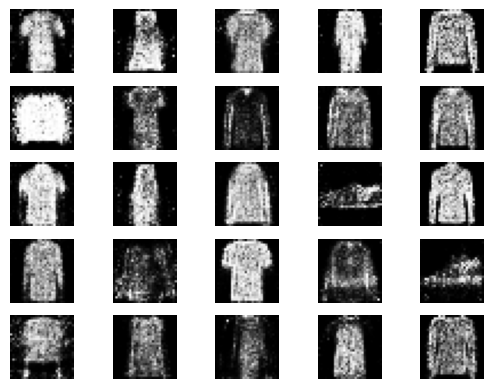

1/1 [==============================] - 0s 25ms/step
21001 [Discriminator loss: 0.426205, acc.: 81.25%] [Generator loss: 1.904133]
1/1 [==============================] - 0s 26ms/step
21002 [Discriminator loss: 0.371802, acc.: 81.25%] [Generator loss: 1.936779]
1/1 [==============================] - 0s 27ms/step
21003 [Discriminator loss: 0.325431, acc.: 84.38%] [Generator loss: 1.700539]
1/1 [==============================] - 0s 24ms/step
21004 [Discriminator loss: 0.505093, acc.: 76.56%] [Generator loss: 1.675969]
1/1 [==============================] - 0s 23ms/step
21005 [Discriminator loss: 0.504945, acc.: 68.75%] [Generator loss: 1.679379]
1/1 [==============================] - 0s 48ms/step
21006 [Discriminator loss: 0.496343, acc.: 70.31%] [Generator loss: 1.655349]
1/1 [==============================] - 0s 25ms/step
21007 [Discriminator loss: 0.396588, acc.: 78.12%] [Generator loss: 1.435137]
1/1 [==============================] - 0s 27ms/step
21008 [Discriminator loss: 0.481334, a

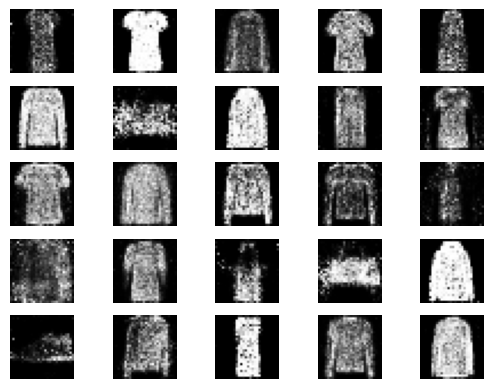

1/1 [==============================] - 0s 25ms/step
22001 [Discriminator loss: 0.440498, acc.: 79.69%] [Generator loss: 1.900226]
1/1 [==============================] - 0s 26ms/step
22002 [Discriminator loss: 0.486606, acc.: 78.12%] [Generator loss: 1.669009]
1/1 [==============================] - 0s 24ms/step
22003 [Discriminator loss: 0.421182, acc.: 79.69%] [Generator loss: 1.718847]
1/1 [==============================] - 0s 26ms/step
22004 [Discriminator loss: 0.347992, acc.: 87.50%] [Generator loss: 1.356637]
1/1 [==============================] - 0s 32ms/step
22005 [Discriminator loss: 0.445545, acc.: 75.00%] [Generator loss: 1.877575]
1/1 [==============================] - 0s 28ms/step
22006 [Discriminator loss: 0.526824, acc.: 75.00%] [Generator loss: 1.739822]
1/1 [==============================] - 0s 29ms/step
22007 [Discriminator loss: 0.418428, acc.: 85.94%] [Generator loss: 1.522509]
1/1 [==============================] - 0s 27ms/step
22008 [Discriminator loss: 0.519452, a

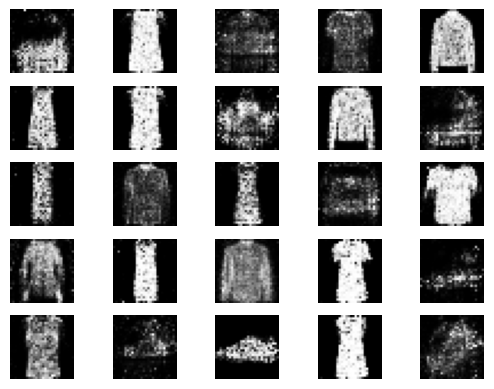

1/1 [==============================] - 0s 29ms/step
23001 [Discriminator loss: 0.470594, acc.: 76.56%] [Generator loss: 1.728722]
1/1 [==============================] - 0s 32ms/step
23002 [Discriminator loss: 0.484524, acc.: 75.00%] [Generator loss: 1.454024]
1/1 [==============================] - 0s 40ms/step
23003 [Discriminator loss: 0.418859, acc.: 79.69%] [Generator loss: 1.823802]
1/1 [==============================] - 0s 27ms/step
23004 [Discriminator loss: 0.552496, acc.: 68.75%] [Generator loss: 1.670137]
1/1 [==============================] - 0s 31ms/step
23005 [Discriminator loss: 0.447121, acc.: 82.81%] [Generator loss: 1.758154]
1/1 [==============================] - 0s 29ms/step
23006 [Discriminator loss: 0.549093, acc.: 71.88%] [Generator loss: 1.847477]
1/1 [==============================] - 0s 35ms/step
23007 [Discriminator loss: 0.583098, acc.: 62.50%] [Generator loss: 1.435185]
1/1 [==============================] - 0s 38ms/step
23008 [Discriminator loss: 0.513130, a

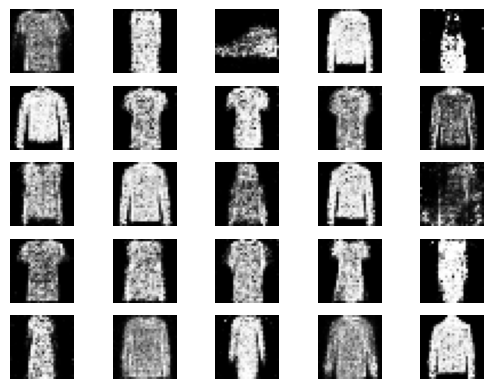

1/1 [==============================] - 0s 32ms/step
24001 [Discriminator loss: 0.514233, acc.: 78.12%] [Generator loss: 1.761863]
1/1 [==============================] - 0s 34ms/step
24002 [Discriminator loss: 0.401589, acc.: 84.38%] [Generator loss: 1.487348]
1/1 [==============================] - 0s 56ms/step
24003 [Discriminator loss: 0.492465, acc.: 70.31%] [Generator loss: 1.552580]
1/1 [==============================] - 0s 38ms/step
24004 [Discriminator loss: 0.439854, acc.: 76.56%] [Generator loss: 1.593533]
1/1 [==============================] - 0s 38ms/step
24005 [Discriminator loss: 0.511416, acc.: 71.88%] [Generator loss: 1.522247]
1/1 [==============================] - 0s 35ms/step
24006 [Discriminator loss: 0.374299, acc.: 84.38%] [Generator loss: 1.705385]
1/1 [==============================] - 0s 31ms/step
24007 [Discriminator loss: 0.685287, acc.: 62.50%] [Generator loss: 1.641536]
1/1 [==============================] - 0s 40ms/step
24008 [Discriminator loss: 0.391283, a

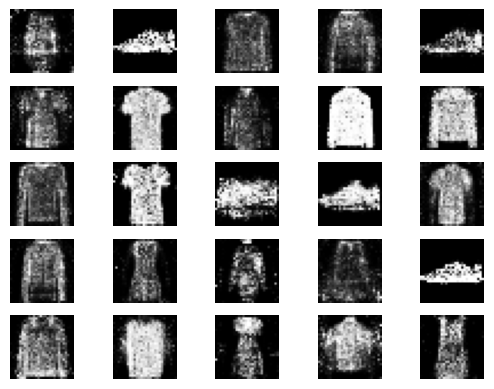

1/1 [==============================] - 0s 24ms/step
25001 [Discriminator loss: 0.548607, acc.: 71.88%] [Generator loss: 1.811860]
1/1 [==============================] - 0s 36ms/step
25002 [Discriminator loss: 0.498853, acc.: 70.31%] [Generator loss: 1.735013]
1/1 [==============================] - 0s 24ms/step
25003 [Discriminator loss: 0.292432, acc.: 85.94%] [Generator loss: 1.965615]
1/1 [==============================] - 0s 27ms/step
25004 [Discriminator loss: 0.566752, acc.: 76.56%] [Generator loss: 1.369479]
1/1 [==============================] - 0s 26ms/step
25005 [Discriminator loss: 0.389310, acc.: 79.69%] [Generator loss: 2.009326]
1/1 [==============================] - 0s 25ms/step
25006 [Discriminator loss: 0.452657, acc.: 78.12%] [Generator loss: 1.659831]
1/1 [==============================] - 0s 25ms/step
25007 [Discriminator loss: 0.464384, acc.: 76.56%] [Generator loss: 1.804318]
1/1 [==============================] - 0s 29ms/step
25008 [Discriminator loss: 0.326987, a

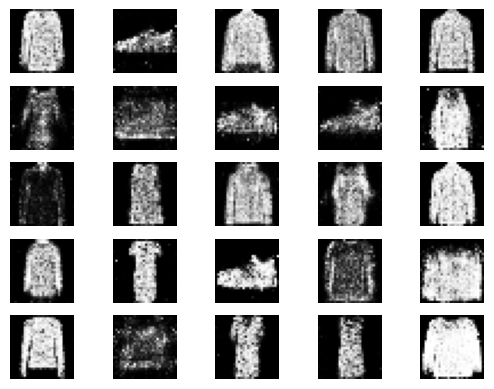

1/1 [==============================] - 0s 40ms/step
26001 [Discriminator loss: 0.440245, acc.: 73.44%] [Generator loss: 1.824609]
1/1 [==============================] - 0s 32ms/step
26002 [Discriminator loss: 0.451936, acc.: 79.69%] [Generator loss: 1.766986]
1/1 [==============================] - 0s 33ms/step
26003 [Discriminator loss: 0.334238, acc.: 85.94%] [Generator loss: 1.941051]
1/1 [==============================] - 0s 32ms/step
26004 [Discriminator loss: 0.591113, acc.: 68.75%] [Generator loss: 1.652012]
1/1 [==============================] - 0s 33ms/step
26005 [Discriminator loss: 0.614154, acc.: 67.19%] [Generator loss: 1.387904]
1/1 [==============================] - 0s 29ms/step
26006 [Discriminator loss: 0.426191, acc.: 79.69%] [Generator loss: 1.445147]
1/1 [==============================] - 0s 29ms/step
26007 [Discriminator loss: 0.469614, acc.: 79.69%] [Generator loss: 1.721157]
1/1 [==============================] - 0s 31ms/step
26008 [Discriminator loss: 0.408707, a

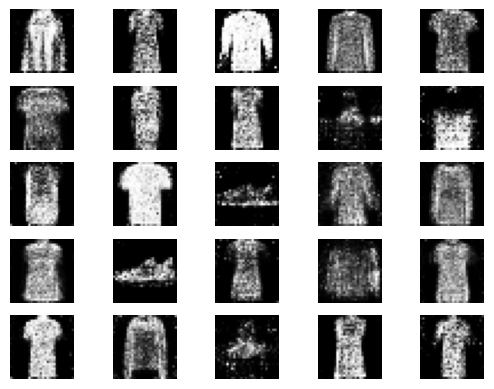

1/1 [==============================] - 0s 33ms/step
27001 [Discriminator loss: 0.440160, acc.: 78.12%] [Generator loss: 1.331549]
1/1 [==============================] - 0s 31ms/step
27002 [Discriminator loss: 0.467821, acc.: 76.56%] [Generator loss: 1.569830]
1/1 [==============================] - 0s 29ms/step
27003 [Discriminator loss: 0.431152, acc.: 82.81%] [Generator loss: 1.936117]
1/1 [==============================] - 0s 46ms/step
27004 [Discriminator loss: 0.345041, acc.: 79.69%] [Generator loss: 1.800255]
1/1 [==============================] - 0s 44ms/step
27005 [Discriminator loss: 0.441840, acc.: 76.56%] [Generator loss: 1.897801]
1/1 [==============================] - 0s 37ms/step
27006 [Discriminator loss: 0.455367, acc.: 81.25%] [Generator loss: 1.935745]
1/1 [==============================] - 0s 70ms/step
27007 [Discriminator loss: 0.511620, acc.: 73.44%] [Generator loss: 1.676047]
1/1 [==============================] - 0s 53ms/step
27008 [Discriminator loss: 0.468426, a

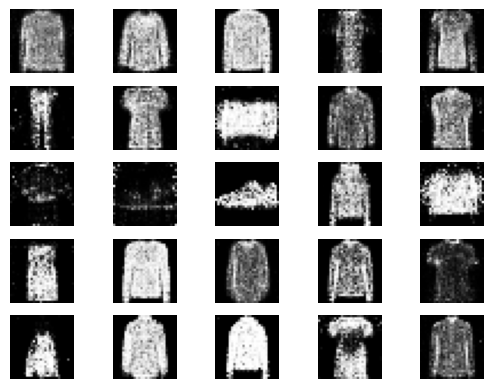

1/1 [==============================] - 0s 30ms/step
28001 [Discriminator loss: 0.566608, acc.: 73.44%] [Generator loss: 1.829458]
1/1 [==============================] - 0s 30ms/step
28002 [Discriminator loss: 0.377555, acc.: 82.81%] [Generator loss: 1.729089]
1/1 [==============================] - 0s 28ms/step
28003 [Discriminator loss: 0.526881, acc.: 71.88%] [Generator loss: 1.748558]
1/1 [==============================] - 0s 32ms/step
28004 [Discriminator loss: 0.452954, acc.: 78.12%] [Generator loss: 1.833858]
1/1 [==============================] - 0s 29ms/step
28005 [Discriminator loss: 0.603566, acc.: 67.19%] [Generator loss: 1.781790]
1/1 [==============================] - 0s 30ms/step
28006 [Discriminator loss: 0.448196, acc.: 79.69%] [Generator loss: 1.568195]
1/1 [==============================] - 0s 30ms/step
28007 [Discriminator loss: 0.363984, acc.: 84.38%] [Generator loss: 1.861423]
1/1 [==============================] - 0s 31ms/step
28008 [Discriminator loss: 0.476490, a

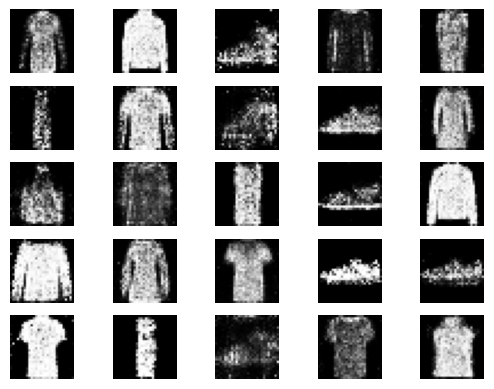

1/1 [==============================] - 0s 26ms/step
29001 [Discriminator loss: 0.435297, acc.: 79.69%] [Generator loss: 1.653380]
1/1 [==============================] - 0s 24ms/step
29002 [Discriminator loss: 0.387328, acc.: 85.94%] [Generator loss: 1.762466]
1/1 [==============================] - 0s 26ms/step
29003 [Discriminator loss: 0.560140, acc.: 70.31%] [Generator loss: 1.612462]
1/1 [==============================] - 0s 26ms/step
29004 [Discriminator loss: 0.471379, acc.: 79.69%] [Generator loss: 1.672774]
1/1 [==============================] - 0s 30ms/step
29005 [Discriminator loss: 0.433547, acc.: 79.69%] [Generator loss: 1.738317]
1/1 [==============================] - 0s 30ms/step
29006 [Discriminator loss: 0.475812, acc.: 78.12%] [Generator loss: 1.879485]
1/1 [==============================] - 0s 24ms/step
29007 [Discriminator loss: 0.369071, acc.: 84.38%] [Generator loss: 1.606290]
1/1 [==============================] - 0s 24ms/step
29008 [Discriminator loss: 0.518476, a

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

# Define the Discriminator
class Discriminator(nn.Module):
    def __init__(self, input_shape):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(np.prod(input_shape), 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, img):
        validity = self.model(img)
        return validity

# Define the Generator
class Generator(nn.Module):
    def __init__(self, z_dim, output_shape):
        super(Generator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(z_dim, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(1024, np.prod(output_shape)),
            nn.Tanh()
        )

        self.output_shape = output_shape

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.size(0), *self.output_shape)
        return img

# Sample images function
def sample_images(epoch, generator, z_dim=100, n_row=5, save_output=True, output_dir="./"):
    generator.eval()
    z = torch.randn(n_row ** 2, z_dim).to(device)
    gen_imgs = generator(z).detach().cpu().numpy()

    fig, axs = plt.subplots(n_row, n_row)
    cnt = 0
    for i in range(n_row):
        for j in range(n_row):
            axs[i, j].imshow(gen_imgs[cnt, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.show()
    if save_output:
        fig.savefig(f"{output_dir}/{epoch}.png")
    plt.close()

# Training function
def train(generator, discriminator, dataloader, epochs, batch_size, device, sample_interval, output_dir):
    adversarial_loss = nn.BCELoss()
    optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

    g_losses = []
    d_losses = []

    for epoch in range(epochs):
        for i, (imgs, _) in enumerate(dataloader):

            # Adversarial ground truths
            valid = torch.ones(imgs.size(0), 1).to(device)
            fake = torch.zeros(imgs.size(0), 1).to(device)

            # Configure input
            real_imgs = imgs.to(device)

            # -----------------
            #  Train Generator
            # -----------------

            optimizer_G.zero_grad()

            # Sample noise as generator input
            z = torch.randn(imgs.size(0), z_dim).to(device)

            # Generate a batch of images
            gen_imgs = generator(z)

            # Loss measures generator's ability to fool the discriminator
            g_loss = adversarial_loss(discriminator(gen_imgs), valid)

            g_loss.backward()
            optimizer_G.step()

            # ---------------------
            #  Train Discriminator
            # ---------------------

            optimizer_D.zero_grad()

            # Measure discriminator's ability to classify real from generated samples
            real_loss = adversarial_loss(discriminator(real_imgs), valid)
            fake_loss = adversarial_loss(discriminator(gen_imgs.detach()), fake)
            d_loss = (real_loss + fake_loss) / 2

            d_loss.backward()
            optimizer_D.step()

            g_losses.append(g_loss.item())
            d_losses.append(d_loss.item())

        avg_g_loss = sum(g_losses) / len(g_losses)
        avg_d_loss = sum(d_losses) / len(d_losses)
        print("Epoch: {}, Discriminator loss: {:.6f}, Discriminator acc: {:.2f}%, Generator loss: {:.6f}".format(epoch, d_loss, d_loss * 100, g_loss))

        # Print epoch details for every 20 epochs


        if epoch % sample_interval == 0:
            sample_images(epoch, generator, output_dir=output_dir)

    # Plot losses
    plt.plot(range(epochs), g_losses, label="Generator Loss")
    plt.plot(range(epochs), d_losses, label="Discriminator Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

# Main function
if __name__ == '__main__':
    # Parameters
    img_shape = (1, 28, 28)
    z_dim = 100
    sample_interval = 1000
    epochs = 30000
    batch_size = 32
    output_dir = "/content/drive/MyDrive/Generated"  # Change this to your desired directory in Google Drive

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Initialize generator and discriminator
    generator = Generator(z_dim, img_shape).to(device)
    discriminator = Discriminator(img_shape).to(device)

    # Configure data loader
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
    ])
    dataset = datasets.FashionMNIST(root="./data", train=True, download=True, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4)

    # Training
    train(generator, discriminator, dataloader, epochs, batch_size, device, sample_interval, output_dir)
